#Installing Requirements

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.0/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import Image

# Training the model

In [12]:
# Load a model
model = YOLO("yolo11n.yaml")  # build a new model from YAML
model = YOLO("yolo11n.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

Transferred 499/499 items from pretrained weights


In [13]:
# Train the model
path = r"/content/drive/MyDrive/aquarium_pretrain/data.yaml"
results = model.train(data=path, epochs=50, imgsz=640)

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=/content/drive/MyDrive/aquarium_pretrain/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=yolo11n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

train: Scanning /content/drive/MyDrive/aquarium_pretrain/train/labels.cache... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/aquarium_pretrain/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.09G      1.503       3.87      1.272        196        640: 100%|██████████| 28/28 [00:14<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.61s/it]

                   all        127        909     0.0202      0.445     0.0475      0.026



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.57G      1.617      3.093      1.262        194        640: 100%|██████████| 28/28 [00:10<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.05s/it]

                   all        127        909     0.0129      0.587     0.0882     0.0432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.06G      1.675      2.471      1.311        198        640: 100%|██████████| 28/28 [00:13<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        127        909      0.439     0.0909      0.194      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.19G      1.582      2.201      1.299        126        640: 100%|██████████| 28/28 [00:15<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all        127        909      0.383      0.308       0.28      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.15G      1.586      1.988      1.303        210        640: 100%|██████████| 28/28 [00:15<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        127        909      0.398      0.357      0.306      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.03G      1.559      1.867      1.276        186        640: 100%|██████████| 28/28 [00:15<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.19s/it]

                   all        127        909      0.363      0.501      0.374      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.22G      1.559      1.826      1.266        200        640: 100%|██████████| 28/28 [00:10<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        127        909      0.495      0.502      0.471      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.32G      1.496       1.71      1.223        340        640: 100%|██████████| 28/28 [00:14<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.73it/s]

                   all        127        909      0.476      0.518       0.48      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.19G      1.518      1.688      1.245        173        640: 100%|██████████| 28/28 [00:15<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        127        909      0.619      0.498      0.551      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.37G      1.466      1.613      1.224        271        640: 100%|██████████| 28/28 [00:14<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        127        909      0.571      0.518      0.504      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.18G      1.434      1.589      1.211        192        640: 100%|██████████| 28/28 [00:10<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        127        909      0.715       0.53      0.589      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.28G      1.435      1.506      1.206        186        640: 100%|██████████| 28/28 [00:11<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.72it/s]

                   all        127        909      0.685       0.55      0.627      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.24G      1.448      1.493      1.209        111        640: 100%|██████████| 28/28 [00:14<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all        127        909      0.618      0.507       0.54      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.19G      1.409      1.463      1.191        137        640: 100%|██████████| 28/28 [00:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]

                   all        127        909        0.7      0.561      0.623      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.13G      1.397       1.44      1.194        163        640: 100%|██████████| 28/28 [00:10<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.40it/s]

                   all        127        909      0.703      0.535      0.613      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.35G      1.411      1.355      1.181        236        640: 100%|██████████| 28/28 [00:13<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.04it/s]

                   all        127        909      0.633      0.657      0.644      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.13G      1.402       1.35      1.176        158        640: 100%|██████████| 28/28 [00:16<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        127        909      0.667      0.673      0.699      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.09G      1.366      1.297      1.161        160        640: 100%|██████████| 28/28 [00:14<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        127        909      0.741       0.61      0.685      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       5.1G      1.346       1.28      1.148        199        640: 100%|██████████| 28/28 [00:10<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]

                   all        127        909      0.783      0.597      0.687      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.15G       1.38      1.316       1.16        223        640: 100%|██████████| 28/28 [00:13<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        127        909       0.74      0.588      0.663      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       5.2G      1.329      1.239      1.148        180        640: 100%|██████████| 28/28 [00:15<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        127        909       0.72       0.62      0.664      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.19G      1.324      1.223      1.151        178        640: 100%|██████████| 28/28 [00:18<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]

                   all        127        909      0.686      0.633      0.673      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.27G      1.331        1.2      1.144        132        640: 100%|██████████| 28/28 [00:10<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.39it/s]

                   all        127        909      0.734      0.656      0.703      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.17G      1.323      1.177      1.139        241        640: 100%|██████████| 28/28 [00:12<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        127        909      0.762      0.639      0.705      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.23G      1.316      1.169      1.124        153        640: 100%|██████████| 28/28 [00:15<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        127        909      0.782      0.668      0.735      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.45G      1.311       1.16      1.134        224        640: 100%|██████████| 28/28 [00:15<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        127        909      0.769       0.68      0.728      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.11G      1.287      1.114      1.123        254        640: 100%|██████████| 28/28 [00:12<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]

                   all        127        909      0.797      0.678      0.745      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.01G      1.257      1.116      1.116        198        640: 100%|██████████| 28/28 [00:11<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]

                   all        127        909      0.738      0.651      0.712      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.25G      1.273      1.101      1.109        228        640: 100%|██████████| 28/28 [00:13<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        127        909      0.758      0.685      0.719      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.08G      1.258      1.078      1.114        169        640: 100%|██████████| 28/28 [00:18<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all        127        909      0.769      0.688      0.737       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.19G      1.262      1.063      1.116        137        640: 100%|██████████| 28/28 [00:11<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        127        909        0.8      0.666      0.732      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.05G      1.227      1.063      1.101        175        640: 100%|██████████| 28/28 [00:11<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        127        909      0.757      0.708      0.748      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.27G      1.234      1.034      1.108        237        640: 100%|██████████| 28/28 [00:15<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all        127        909       0.82      0.657      0.746      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.15G      1.253      1.016      1.105        296        640: 100%|██████████| 28/28 [00:14<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.58it/s]

                   all        127        909      0.784      0.708      0.759      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.17G      1.205      1.012      1.084        185        640: 100%|██████████| 28/28 [00:12<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.25s/it]

                   all        127        909      0.755      0.753      0.765      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       5.1G       1.24      1.006      1.097        194        640: 100%|██████████| 28/28 [00:11<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]

                   all        127        909      0.824      0.671      0.763      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.96G      1.208     0.9865      1.091        230        640: 100%|██████████| 28/28 [00:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all        127        909       0.82      0.676      0.754      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.14G      1.185     0.9584      1.084        284        640: 100%|██████████| 28/28 [00:18<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all        127        909      0.799      0.704      0.763      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.11G      1.202      0.958      1.075        267        640: 100%|██████████| 28/28 [00:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.08s/it]

                   all        127        909      0.799      0.741      0.779       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.15G      1.221     0.9618      1.076        183        640: 100%|██████████| 28/28 [00:10<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all        127        909      0.815      0.734      0.779      0.459


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.09G      1.148       1.02      1.058         91        640: 100%|██████████| 28/28 [00:16<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        127        909      0.775      0.693      0.748      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.06G       1.14     0.9623      1.054        126        640: 100%|██████████| 28/28 [00:15<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        127        909      0.828      0.687      0.755      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.97G      1.121     0.9383       1.05        141        640: 100%|██████████| 28/28 [00:13<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        127        909      0.774      0.704      0.766      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.02G        1.1     0.8817      1.041        117        640: 100%|██████████| 28/28 [00:10<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.37it/s]

                   all        127        909      0.779      0.707      0.768      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.09G      1.093     0.8849      1.028         66        640: 100%|██████████| 28/28 [00:12<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.39it/s]

                   all        127        909      0.804      0.702      0.767      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.12G      1.083     0.8621      1.015        118        640: 100%|██████████| 28/28 [00:16<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        127        909      0.794      0.715       0.77      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.26G      1.097     0.8608      1.017        100        640: 100%|██████████| 28/28 [00:13<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.10s/it]

                   all        127        909      0.847      0.686      0.773      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       5.1G      1.068     0.8596      1.008        116        640: 100%|██████████| 28/28 [00:09<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        127        909      0.838      0.703      0.776      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.99G      1.076     0.8382      1.027        140        640: 100%|██████████| 28/28 [00:13<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        127        909      0.819      0.705      0.777      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.15G      1.066     0.8366      1.018        160        640: 100%|██████████| 28/28 [00:16<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]

                   all        127        909      0.814      0.711      0.781       0.47



50 epochs completed in 0.257 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 5.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.12s/it]


                   all        127        909      0.814       0.71      0.781       0.47
                  fish         63        459      0.845      0.741      0.825      0.463
             jellyfish          9        155      0.853      0.897      0.947      0.528
               penguin         17        104      0.668      0.683      0.721      0.335
                puffin         15         74      0.675      0.478      0.581      0.269
                 shark         28         57      0.821      0.614      0.714      0.484
              starfish         17         27      0.924      0.741      0.792      0.563
              stingray         23         33      0.913      0.818      0.883      0.648
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to runs/detect/train4


#Examine training results

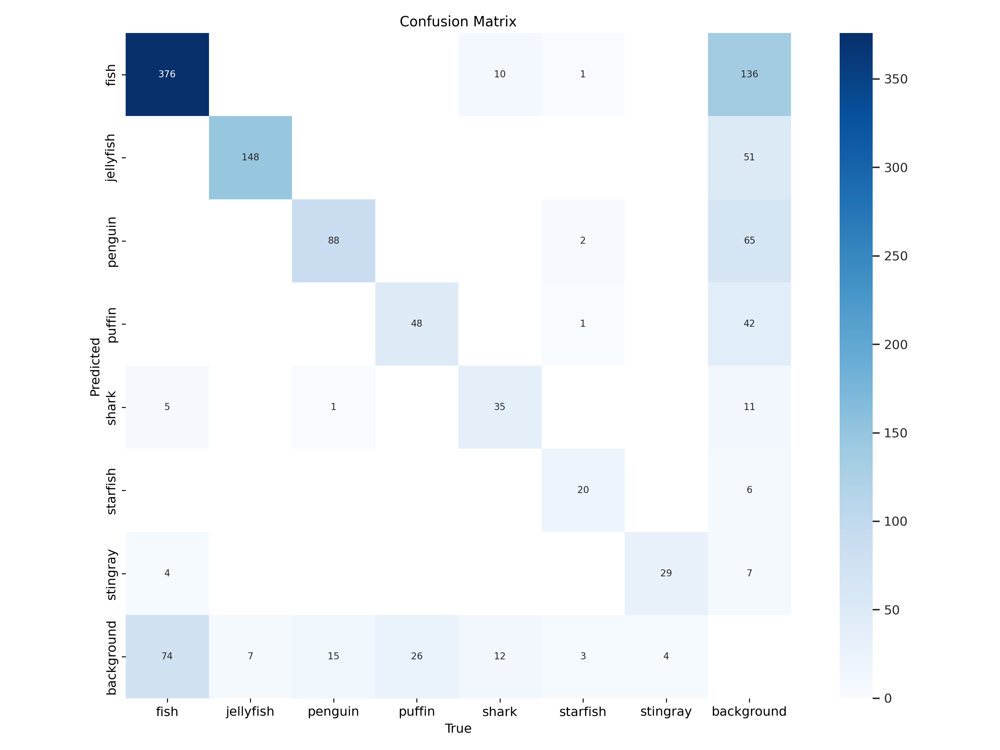

In [14]:
Image("/content/runs/detect/train4/confusion_matrix.png", width=600)  #Confusion Matrix

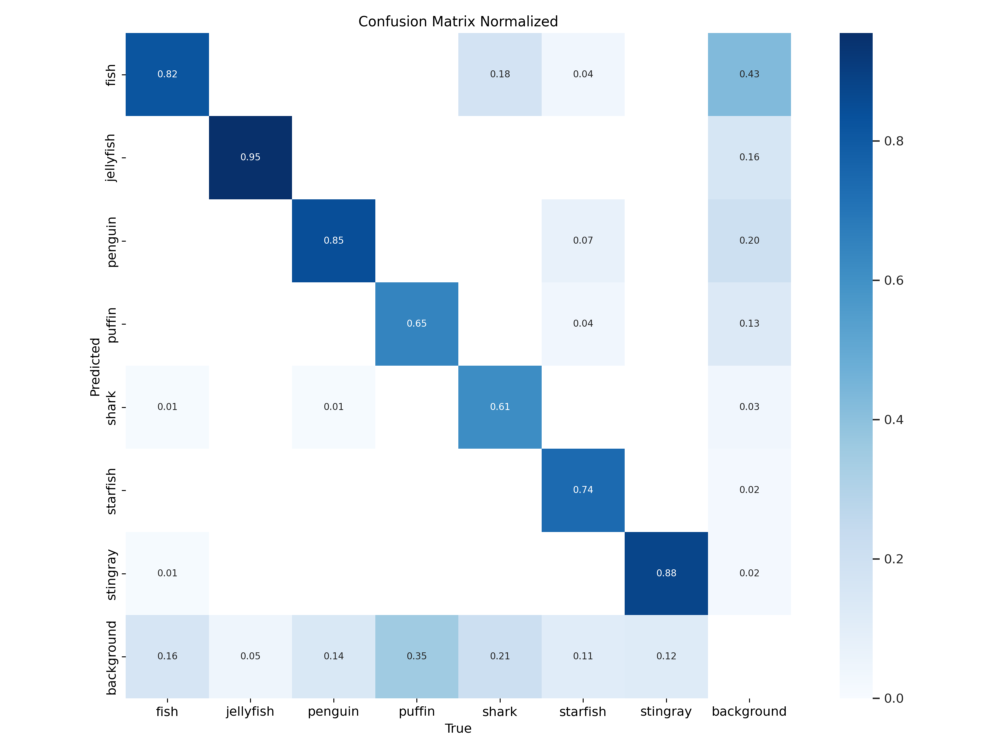

In [38]:
Image("/content/runs/detect/train4/confusion_matrix_normalized.png", width=600)

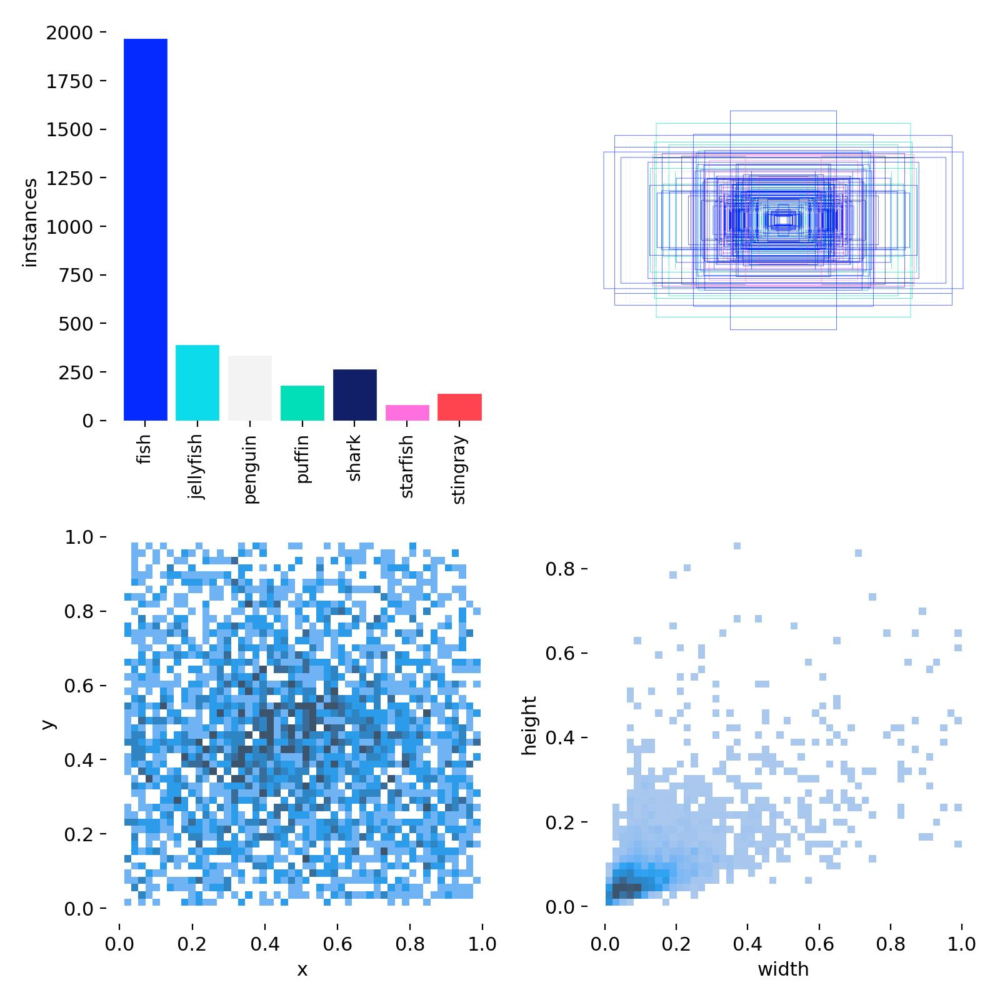

In [15]:
Image("/content/runs/detect/train4/labels.jpg", width=600)     #Plotting levels

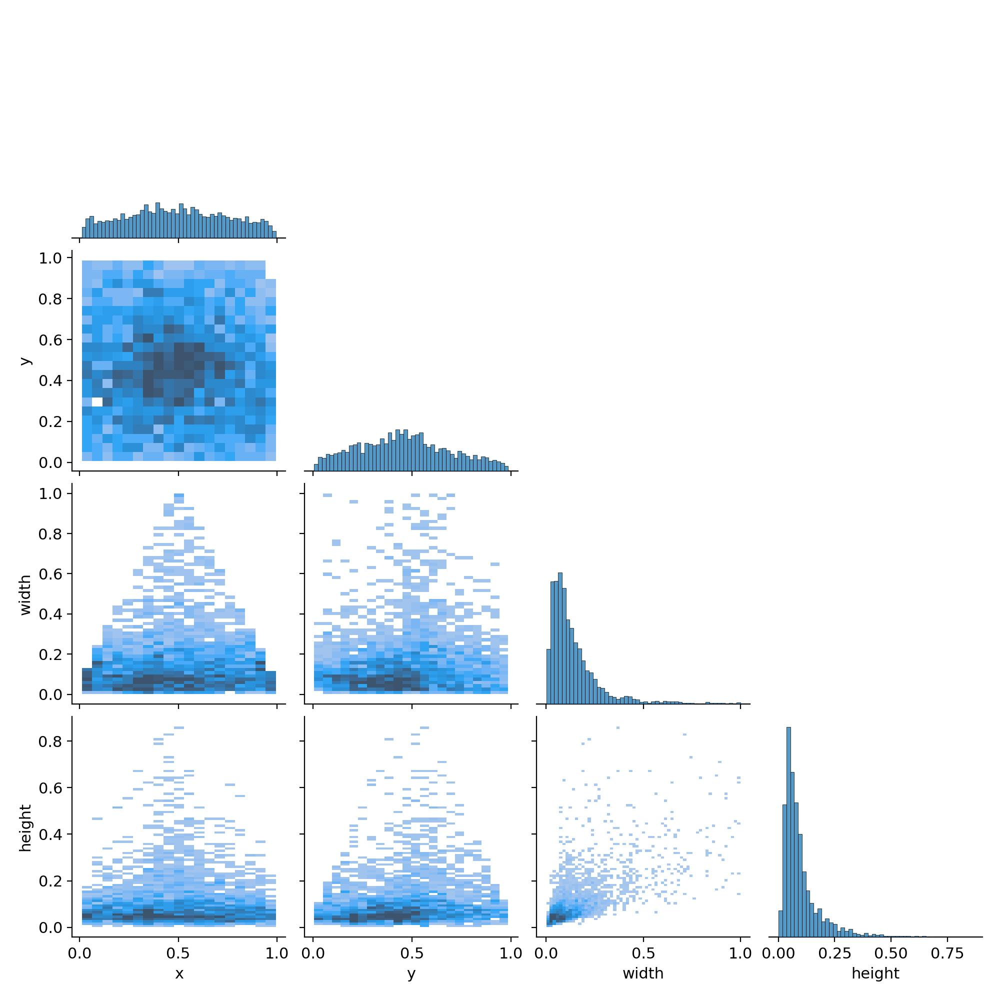

In [40]:
Image("/content/runs/detect/train4/labels_correlogram.jpg", width=600)

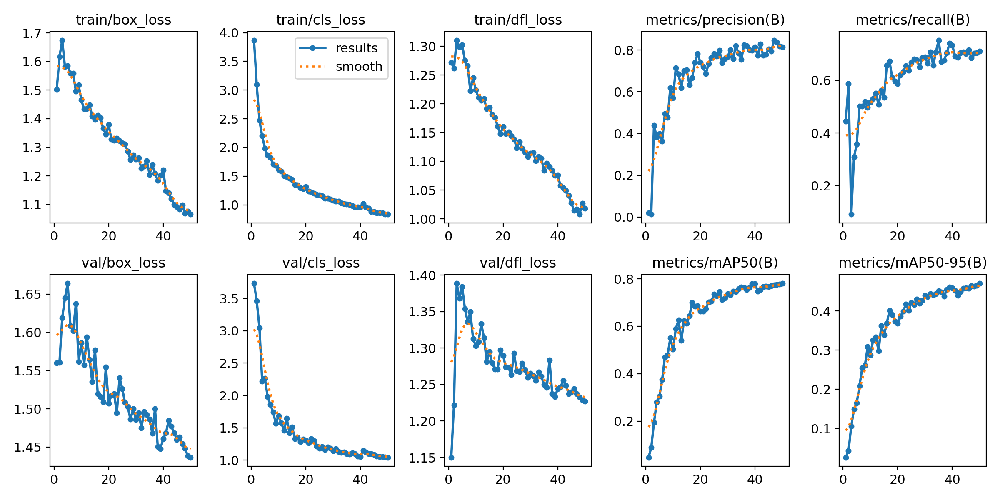

In [16]:
Image("/content/runs/detect/train4/results.png", width=600)  #Complete Results

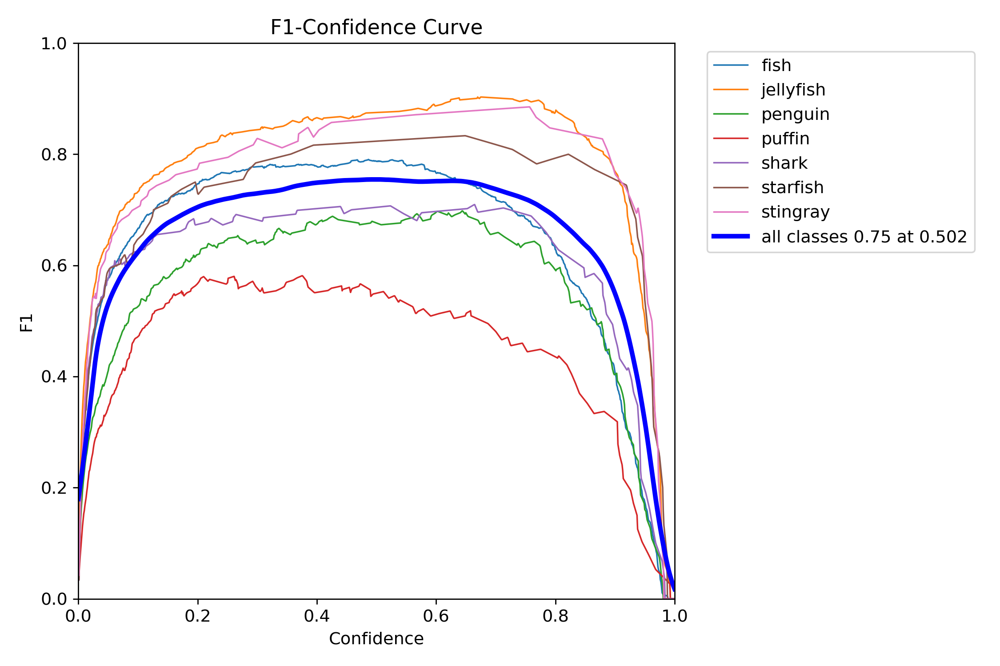

In [34]:
Image("/content/runs/detect/train4/F1_curve.png", width=600)

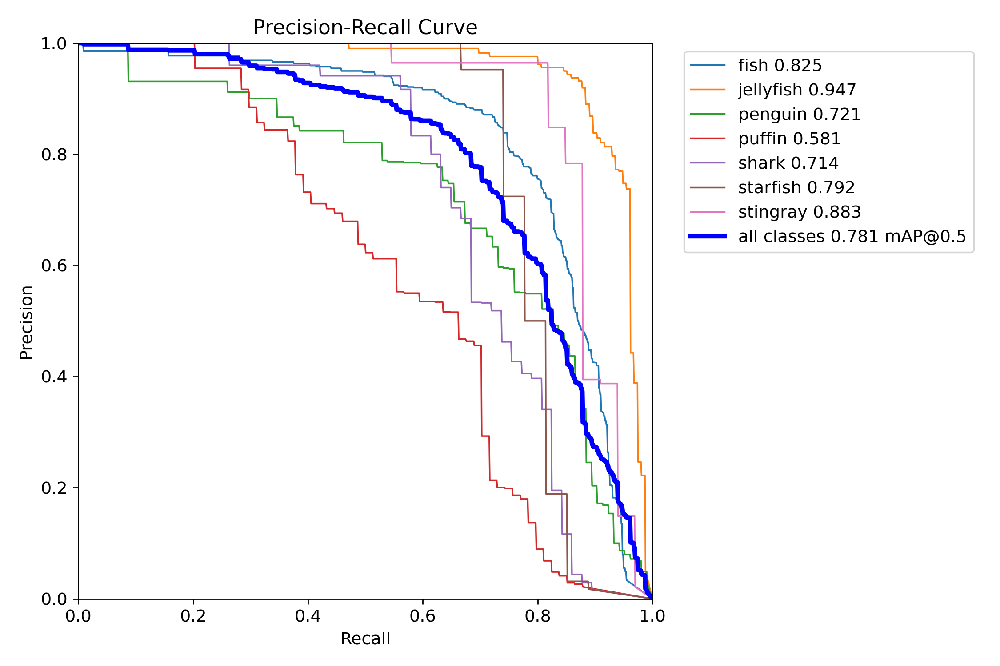

In [35]:
Image("/content/runs/detect/train4/PR_curve.png", width=600)

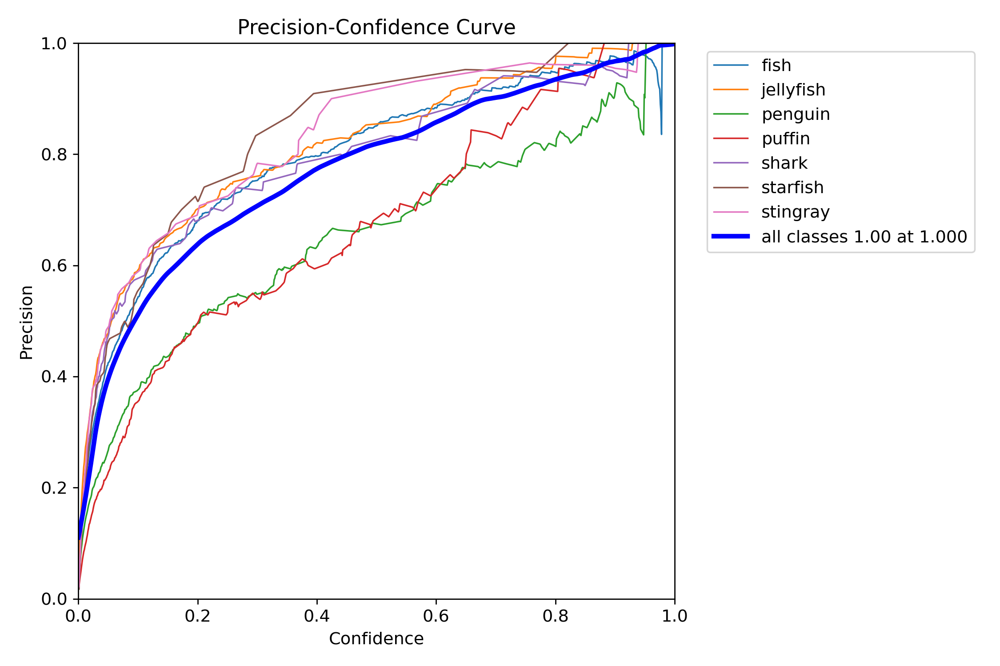

In [36]:
Image("/content/runs/detect/train4/P_curve.png", width=600)

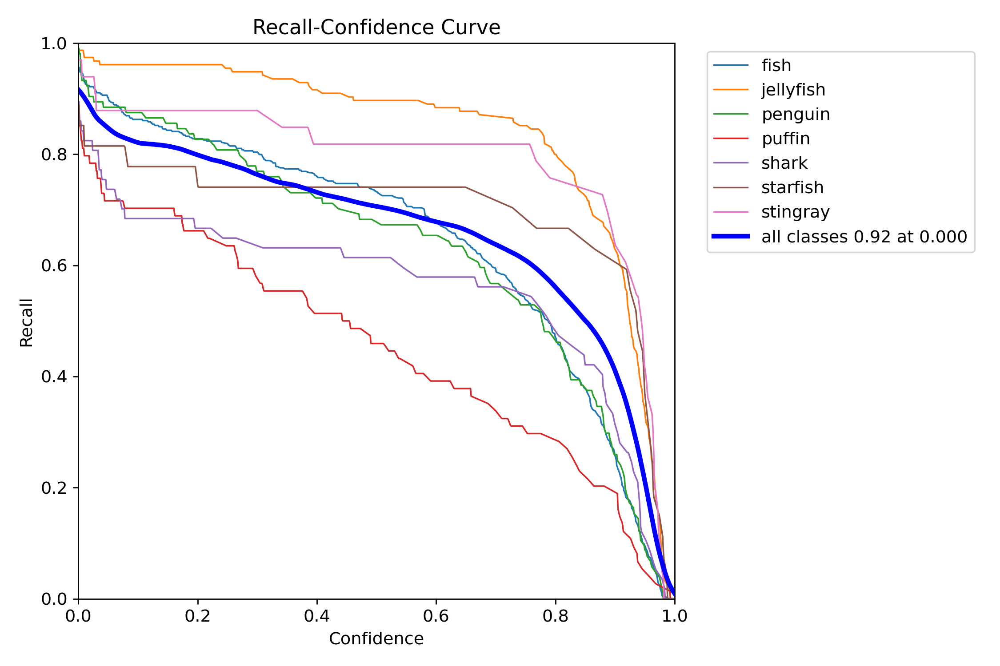

In [37]:
Image("/content/runs/detect/train4/R_curve.png", width=600)

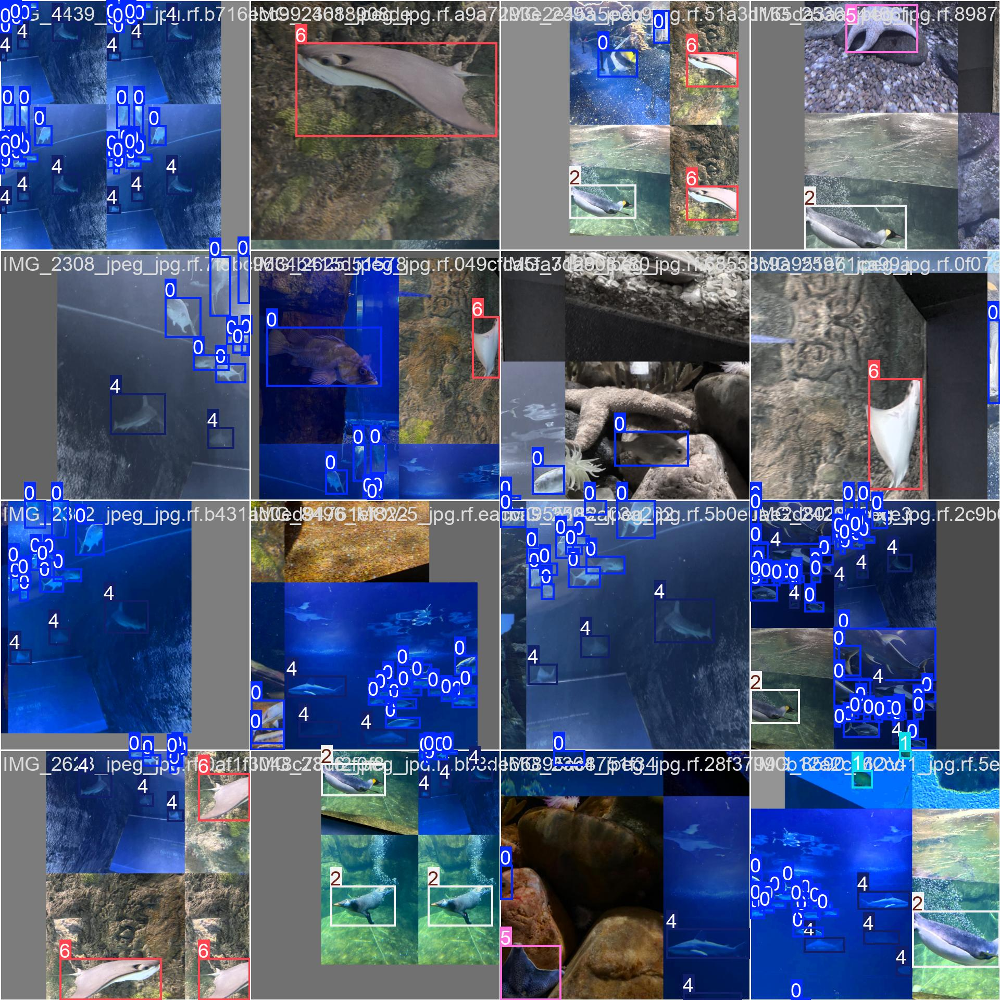

In [17]:
Image("/content/runs/detect/train4/train_batch0.jpg", width=600)  #Some Batch images

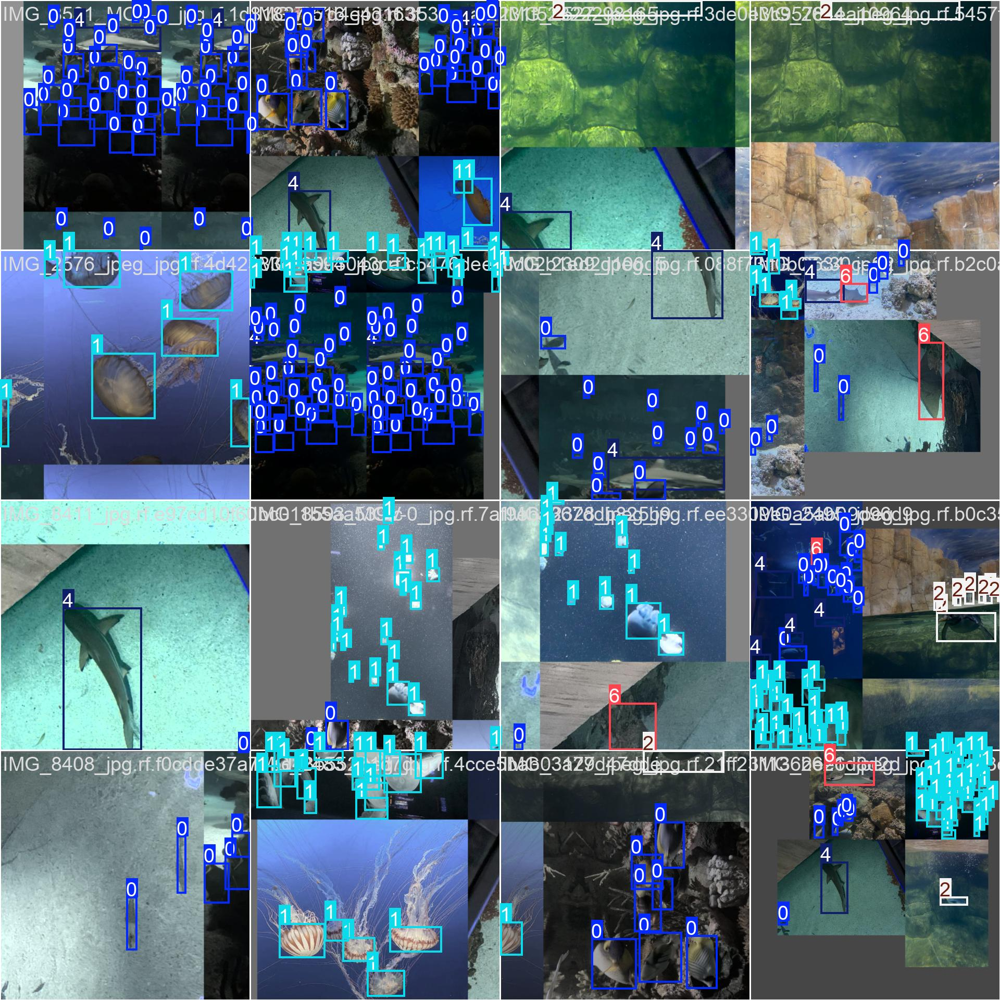

In [41]:
Image("/content/runs/detect/train4/train_batch1.jpg", width=600)

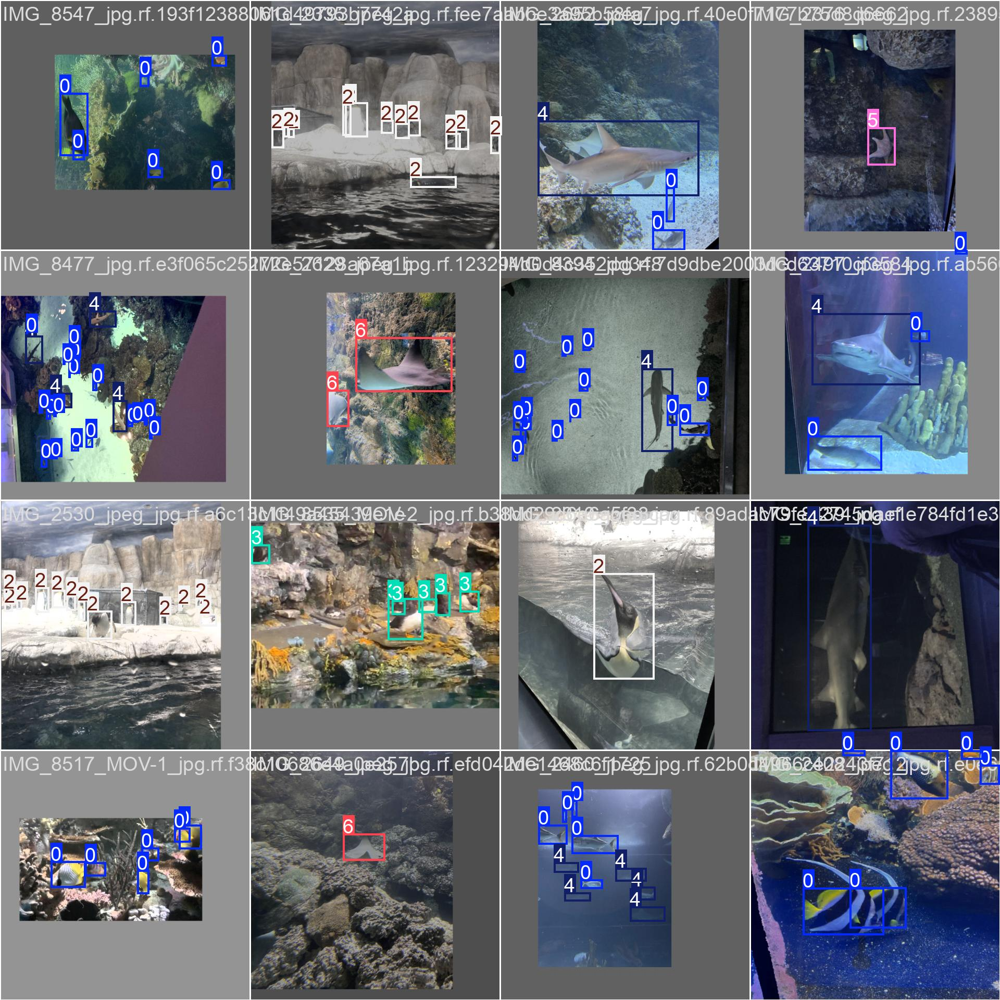

In [42]:
Image("/content/runs/detect/train4/train_batch1120.jpg", width=600)

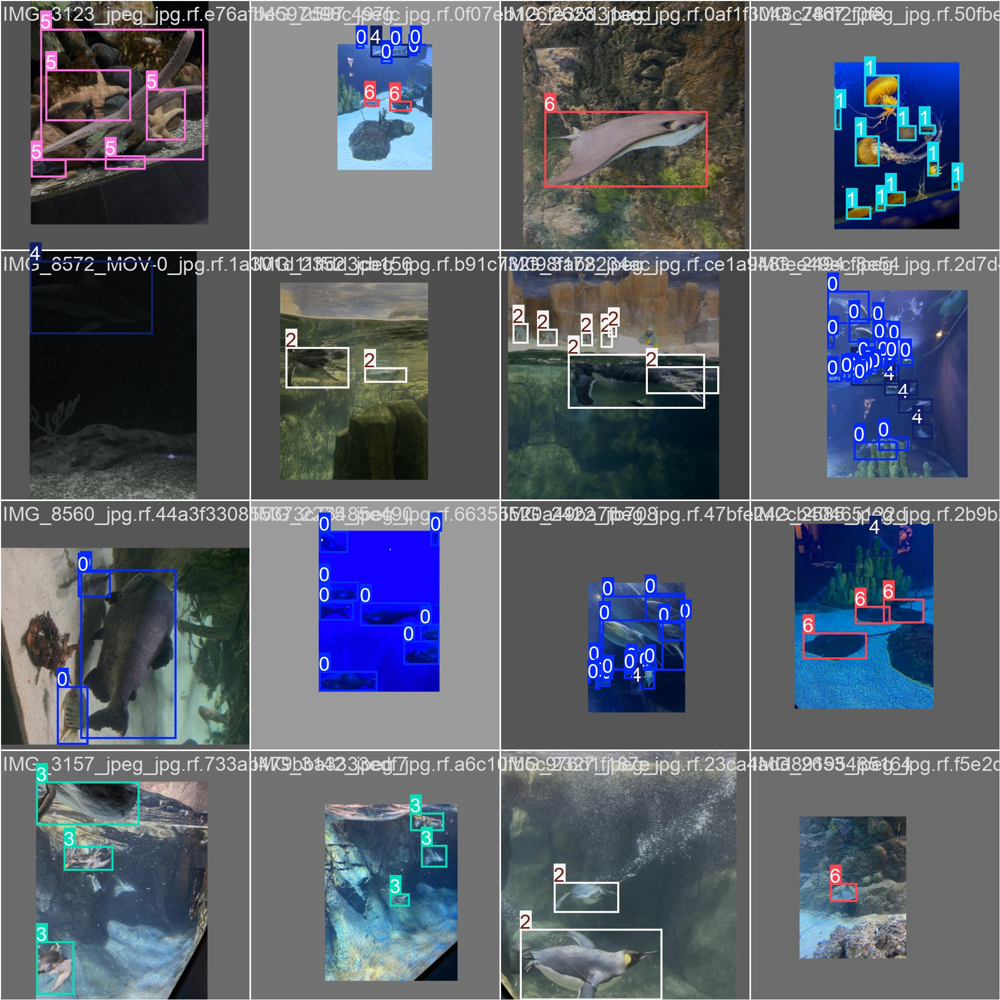

In [43]:
Image("/content/runs/detect/train4/train_batch1121.jpg", width=600)

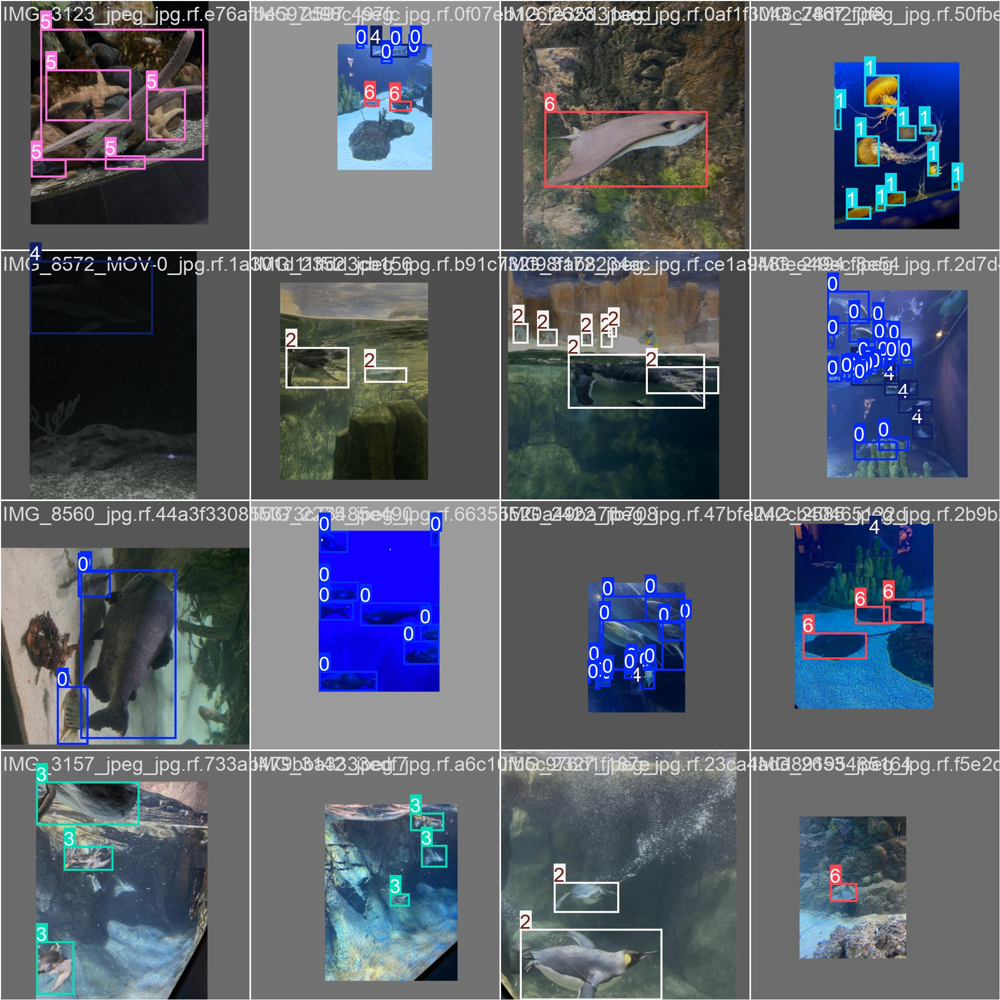

In [44]:
Image("/content/runs/detect/train4/train_batch1121.jpg", width=600)

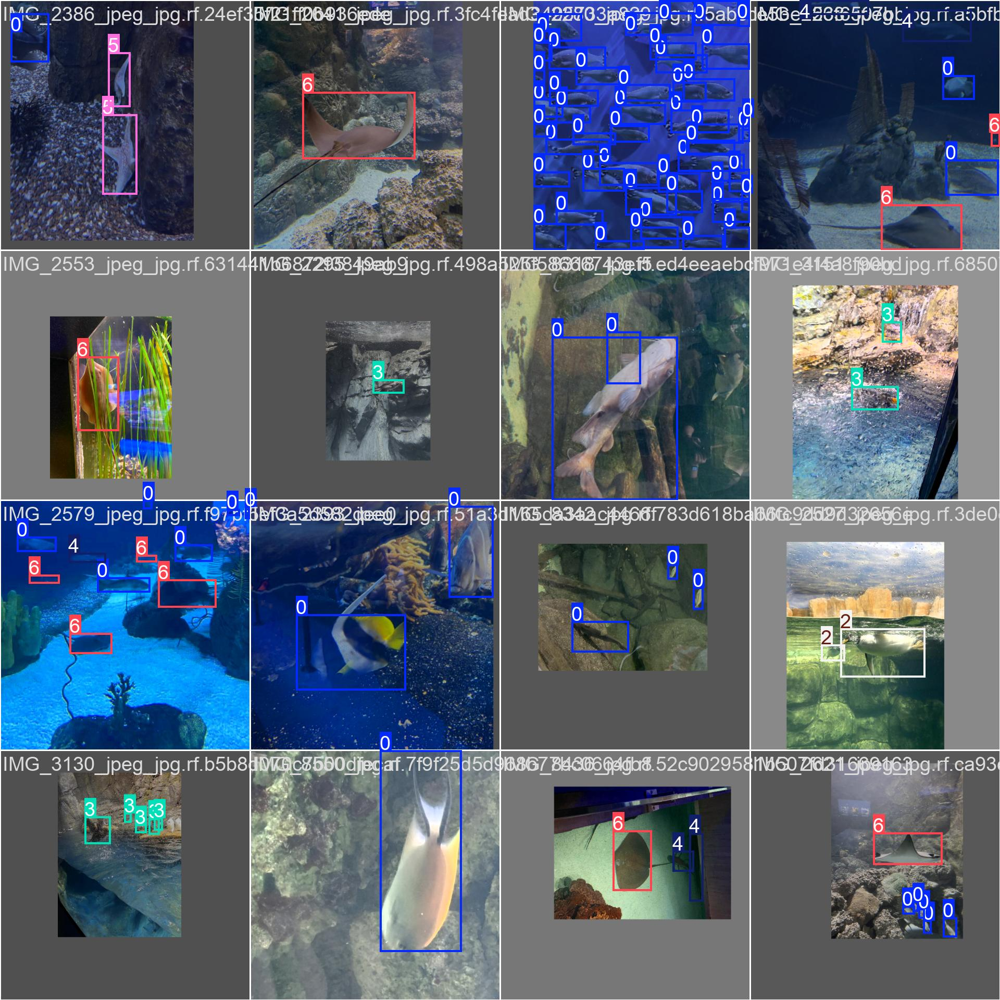

In [45]:
Image("/content/runs/detect/train4/train_batch1122.jpg", width=600)

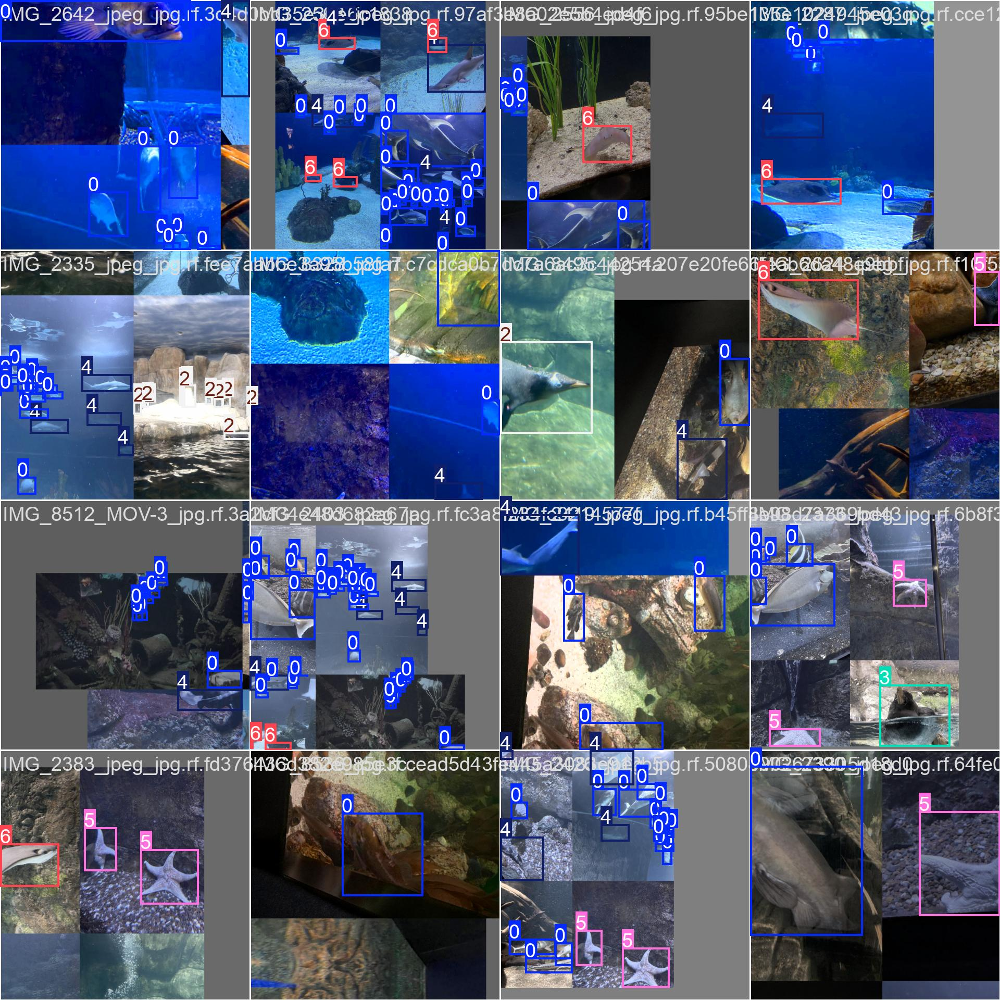

In [46]:
Image("/content/runs/detect/train4/train_batch2.jpg", width=600)

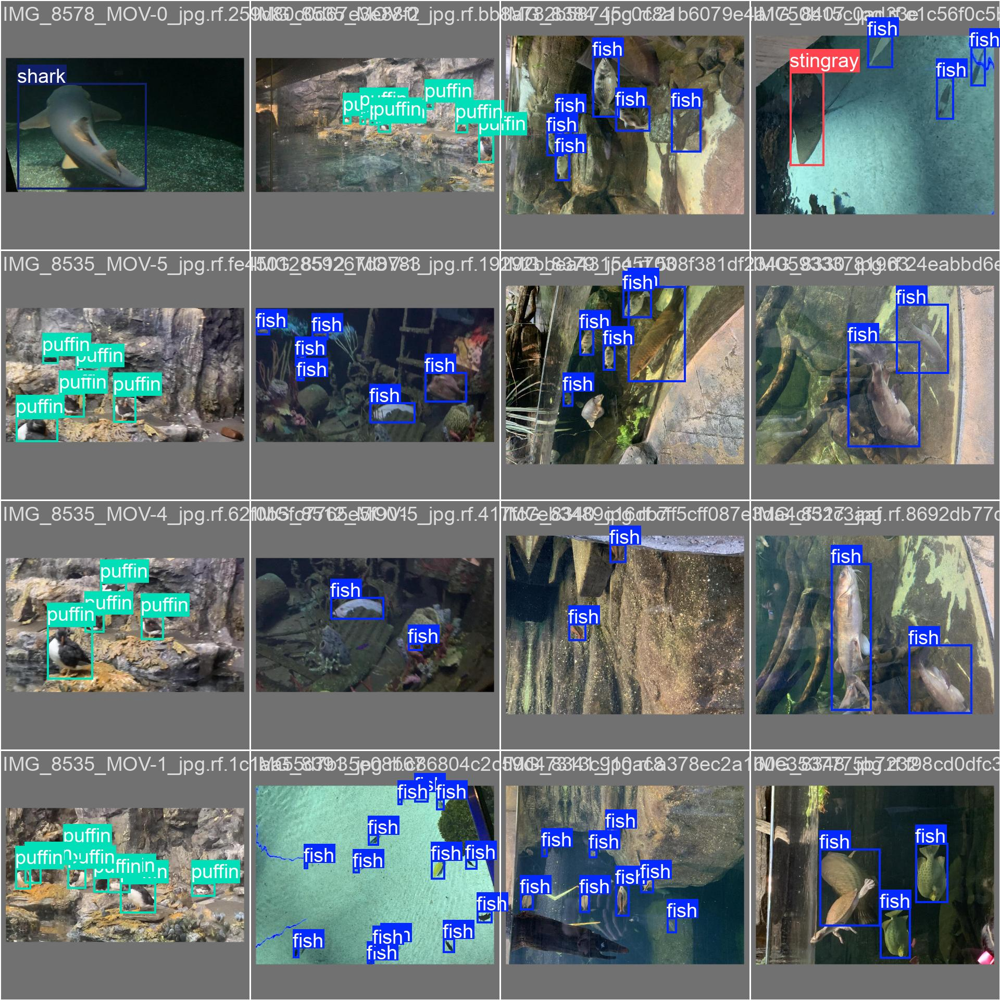

In [47]:
Image("/content/runs/detect/train4/val_batch0_labels.jpg", width=600)

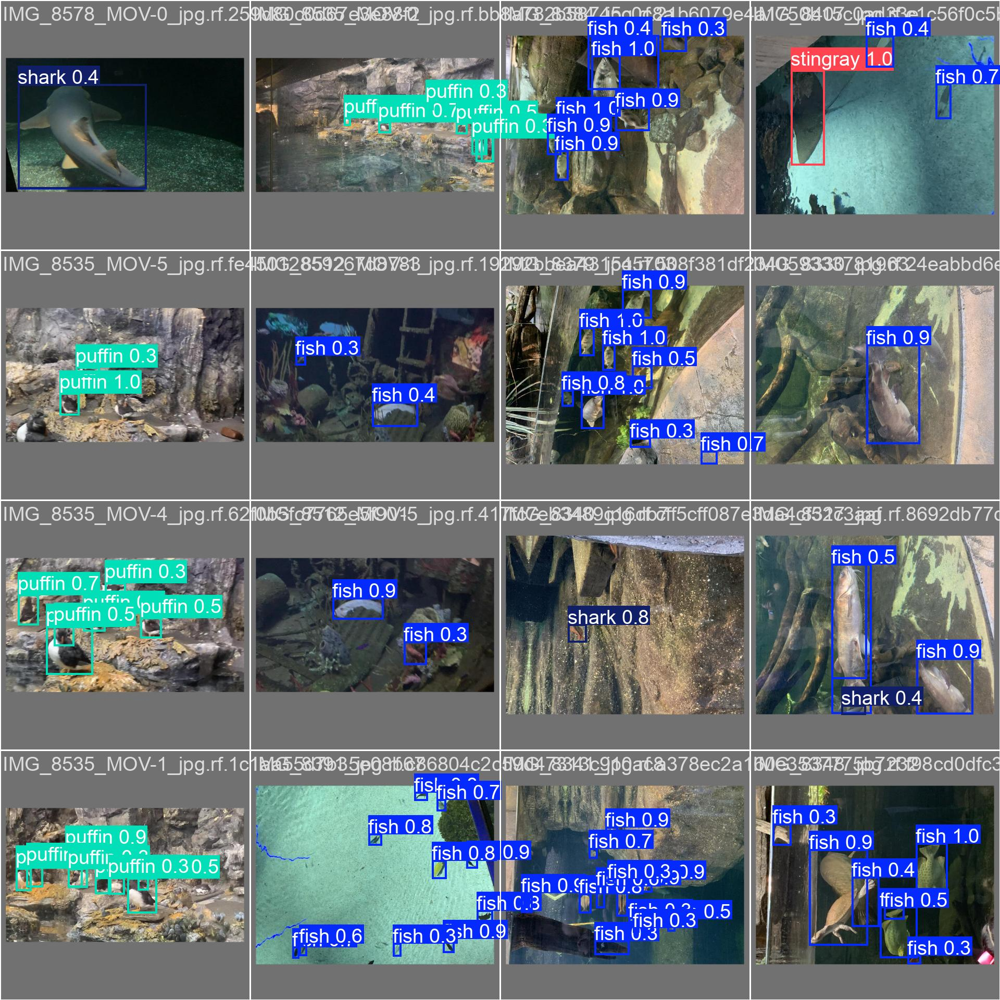

In [48]:
Image("/content/runs/detect/train4/val_batch0_pred.jpg", width=600)

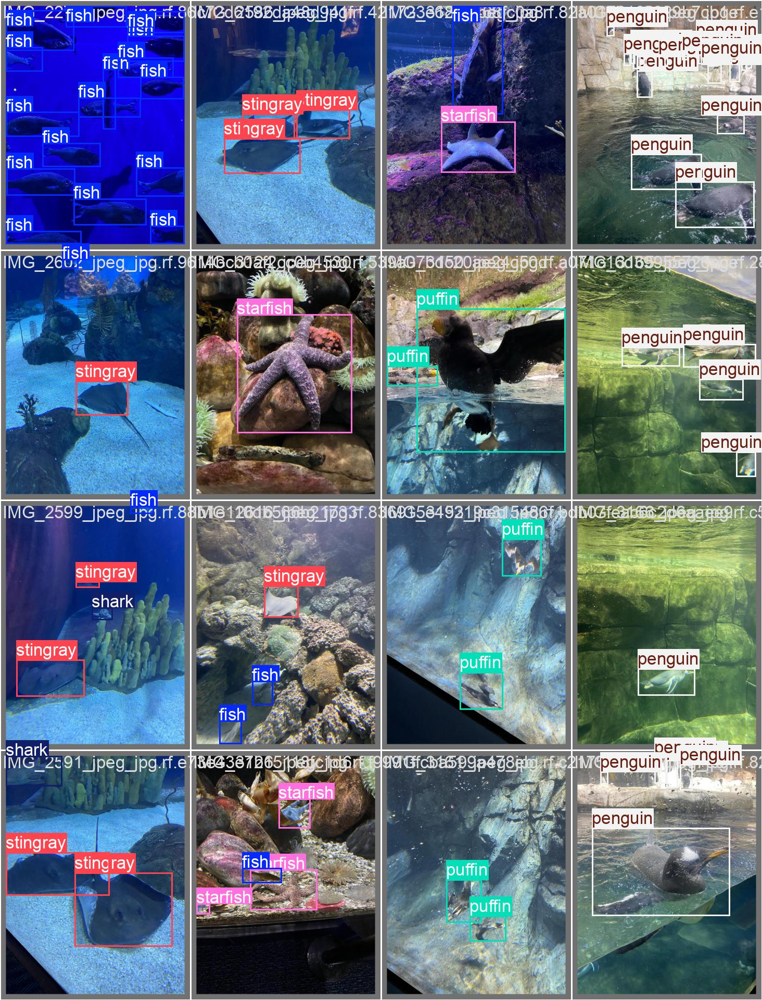

In [49]:
Image("/content/runs/detect/train4/val_batch1_labels.jpg", width=600)

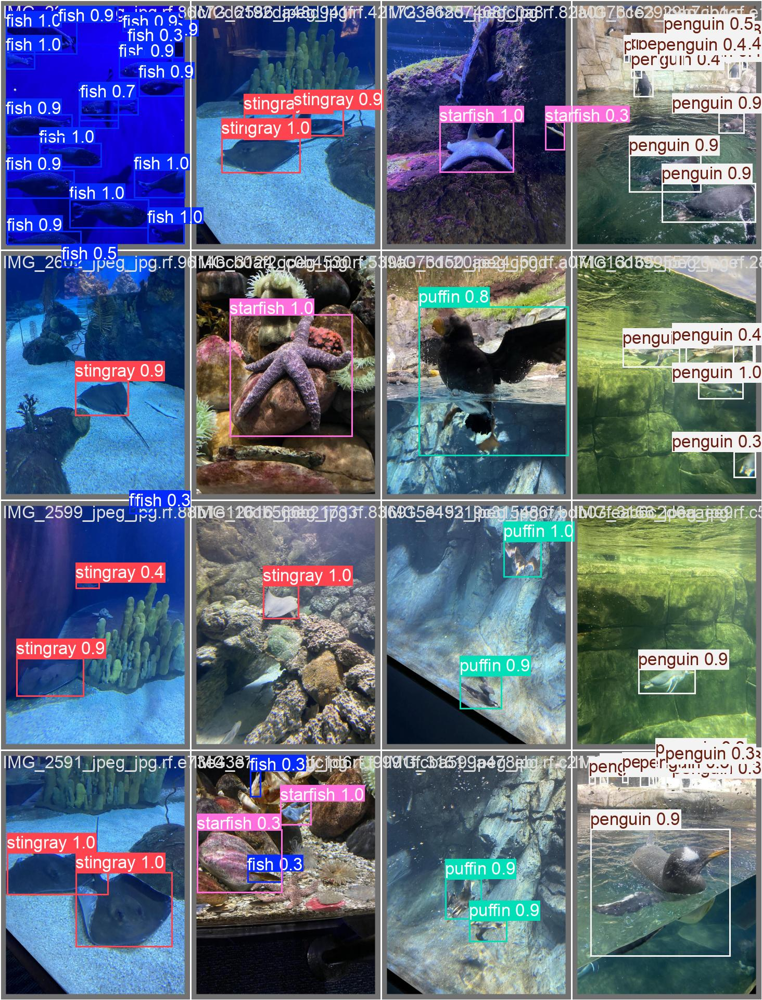

In [50]:
Image("/content/runs/detect/train4/val_batch1_pred.jpg", width=600)

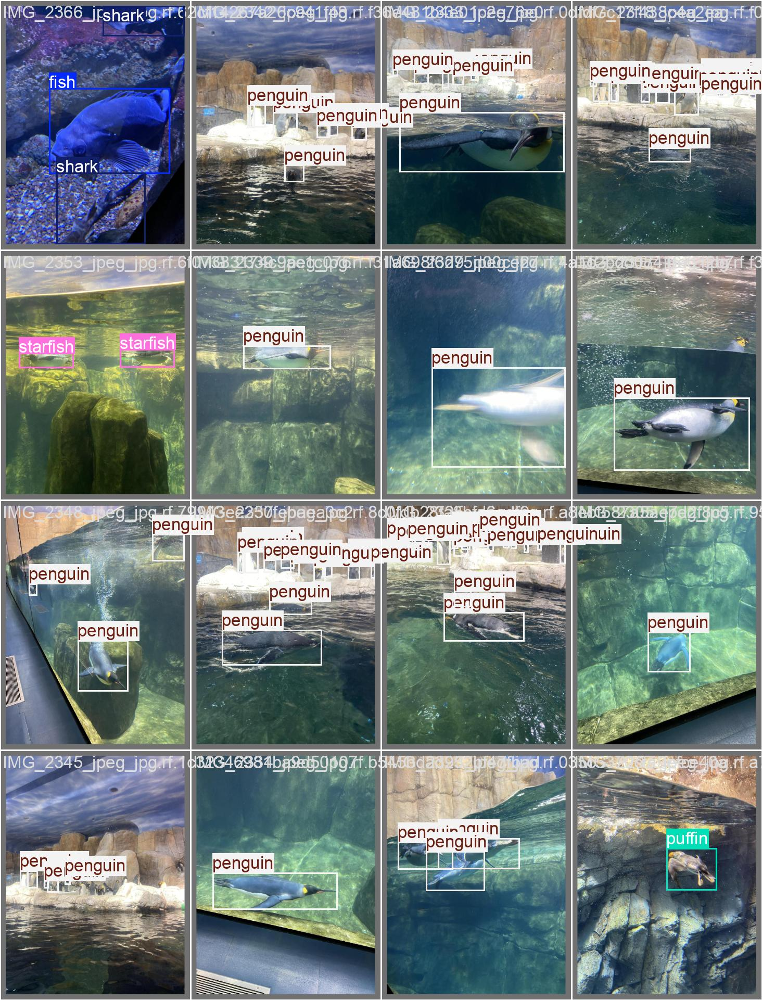

In [51]:
Image("/content/runs/detect/train4/val_batch2_labels.jpg", width=600)

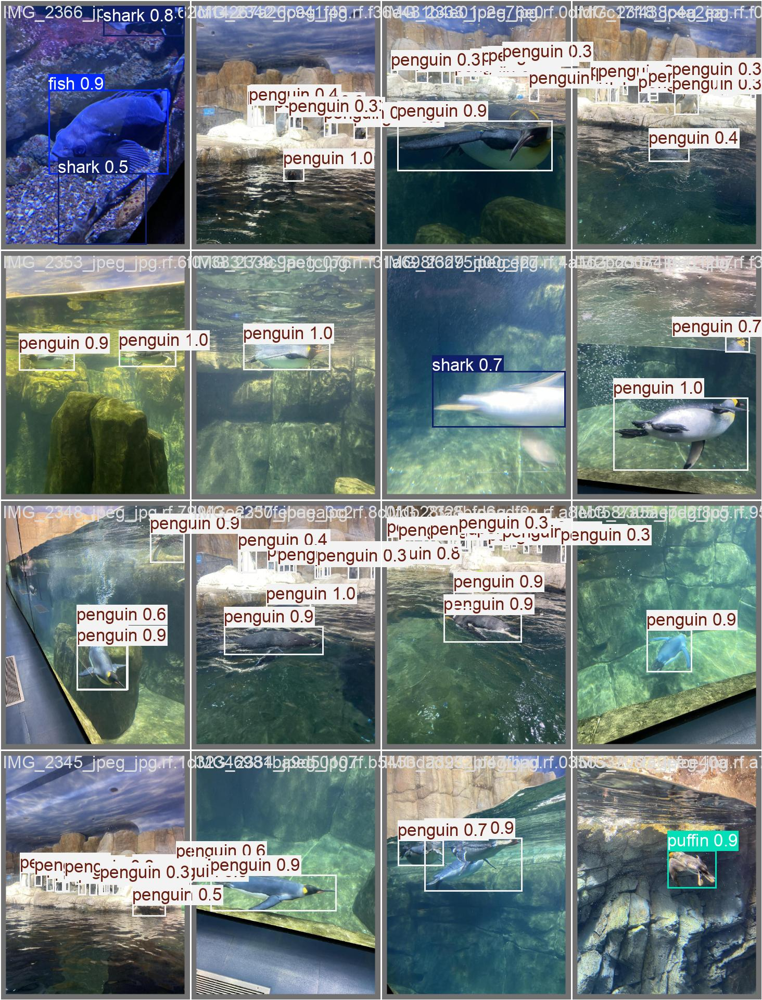

In [52]:
Image("/content/runs/detect/train4/val_batch2_pred.jpg", width=600)

#Validate Fine-Tuned Model

In [19]:
# Load a model
model = YOLO("yolo11n.pt")  # load an official model
path = r"/content/runs/detect/train4/weights/best.pt"
model = YOLO(path)  # load a custom model

In [20]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/drive/MyDrive/aquarium_pretrain/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.64it/s]


                   all        127        909      0.832      0.707      0.782      0.473
                  fish         63        459      0.865      0.728      0.826      0.468
             jellyfish          9        155      0.857      0.897      0.947      0.532
               penguin         17        104      0.677      0.673      0.719      0.338
                puffin         15         74      0.717      0.459      0.581      0.267
                 shark         28         57      0.857      0.631      0.725      0.495
              starfish         17         27      0.932      0.741      0.793      0.559
              stingray         23         33      0.923      0.818      0.882      0.653
Speed: 0.3ms preprocess, 12.5ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/val


array([    0.46763,     0.53195,     0.33792,     0.26713,     0.49488,     0.55863,     0.65265])

#Prediction

In [54]:
# Load a model
model = YOLO("yolo11n.pt")  # load an official model
model = YOLO(r"/content/runs/detect/train4/weights/best.pt")  # load a custom model

In [55]:
# Predict with the model
results = model.predict(source = "/content/drive/MyDrive/aquarium_pretrain/test/images", save=True)  # predict on an image


image 1/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg: 640x480 1 puffin, 10.7ms
image 2/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg: 640x480 17 penguins, 9.3ms
image 3/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg: 640x480 8 penguins, 9.5ms
image 4/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg: 640x480 2 penguins, 9.5ms
image 5/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg: 640x480 6 penguins, 9.3ms
image 6/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c305849.jpg: 640x480 4 fishs, 9.4ms
image 7/63 /content/drive/MyDrive/aquarium_pretrain/test/images/IMG_2379_jpeg_jpg.rf.7dc3160c937072d26d4624c

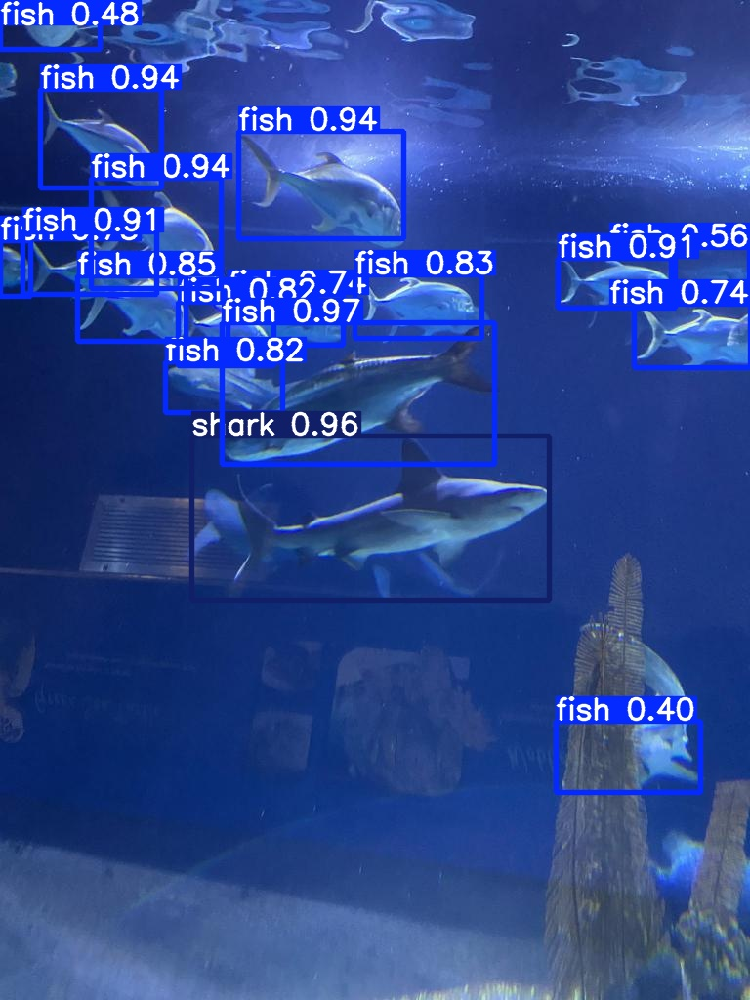

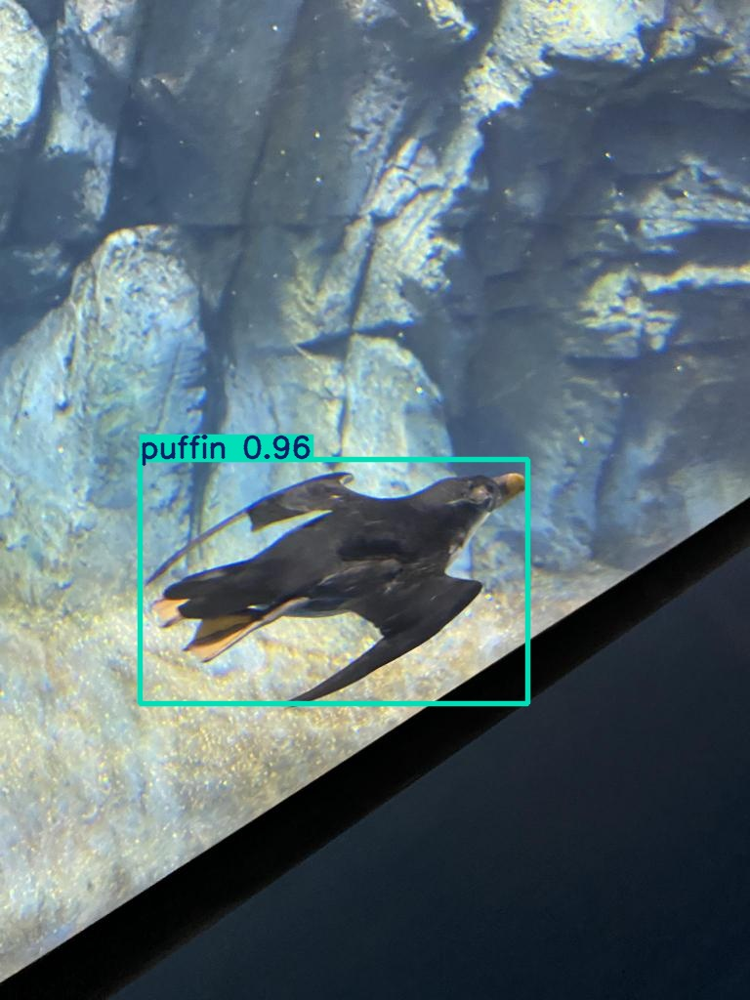

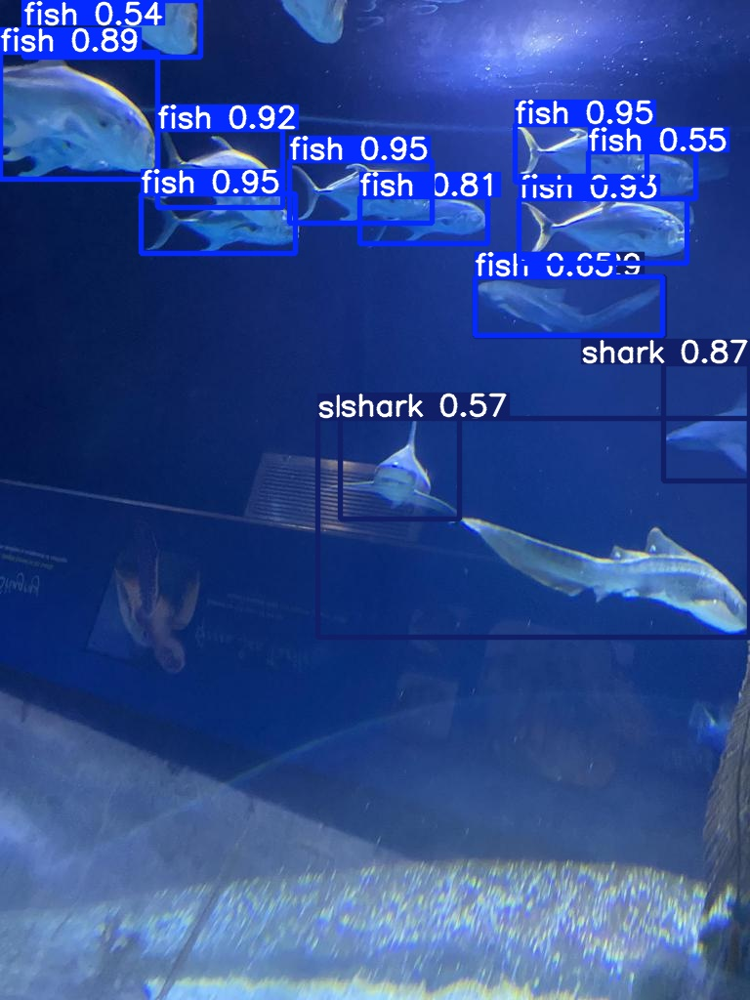

In [56]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

#Performing with other Data Images in internet

In [64]:
# Predict with the model
results = model.predict(source = "/content/runs/detect/R.jpeg", save=True)  # predict on an image


WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
image 1/1 /content/runs/detect/R.jpeg: 416x640 34 fishs, 17.3ms
Speed: 3.1ms preprocess, 17.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.


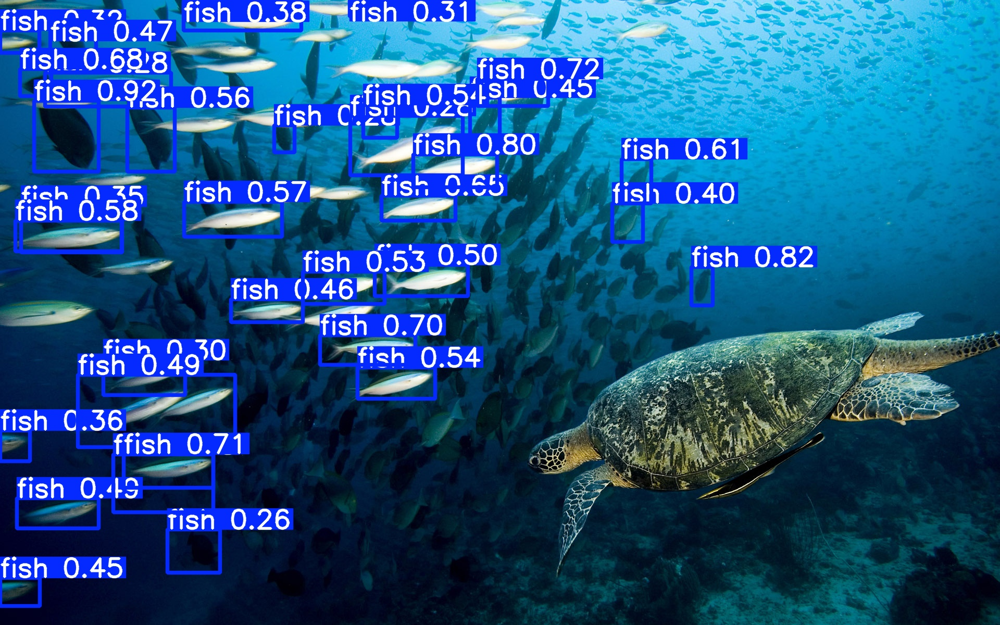

WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.


In [65]:
Image("/content/runs/detect/predict/R.jpg", width=600)